In [48]:
import numpy as np
import os
from skimage import io
import glob,string
import pandas as pd
from keras.layers import Input, Dense
from keras.models import Model
from keras.callbacks import TensorBoard
from keras.layers import Input, Dense, Activation, Flatten, Conv2D, MaxPooling2D
from keras.models import Sequential
from keras.datasets import mnist
from sklearn.manifold import LocallyLinearEmbedding
from sklearn.model_selection import train_test_split
from matplotlib import pyplot
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt


In [49]:
path = 'Data/coil-100/coil-100/*.png'
#list files
files=glob.glob(path)

In [50]:
import codecs
from tqdm import tqdm
def contructDataframe(file_list):
    """
    this function builds a data frame which contains 
    the path to image and the tag/object name using the prefix of the image name
    """
    data=[]
    for file in tqdm(file_list):
        data.append((file,file.split("/")[-1].split("__")[0]))
    return pd.DataFrame(data,columns=['path','label'])

In [51]:
df=contructDataframe(files)


100%|██████████| 5482/5482 [00:00<00:00, 656610.16it/s]


In [52]:
df.tail(10)

,path,label
5472,Data/coil-100/coil-100/obj92__10.png,obj92
5473,Data/coil-100/coil-100/obj8__265.png,obj8
5474,Data/coil-100/coil-100/obj44__305.png,obj44
5475,Data/coil-100/coil-100/obj96__355.png,obj96
5476,Data/coil-100/coil-100/obj82__10.png,obj82
5477,Data/coil-100/coil-100/obj56__95.png,obj56
5478,Data/coil-100/coil-100/obj72__340.png,obj72
5479,Data/coil-100/coil-100/obj73__340.png,obj73
5480,Data/coil-100/coil-100/obj46__95.png,obj46
5481,Data/coil-100/coil-100/obj61__0.png,obj61


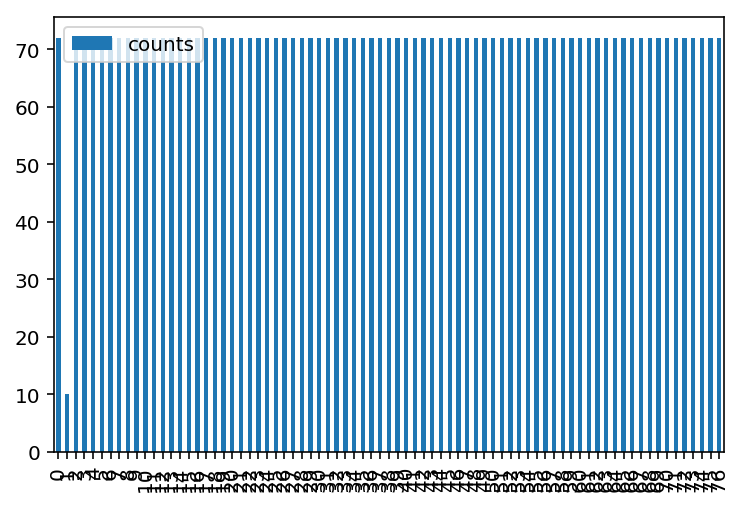

In [53]:
import seaborn as sns
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
counts=df.groupby(df.label).size().reset_index(name="counts")
counts.plot.bar()

In [54]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(df.path, df.label, test_size=0.15,random_state=0,stratify= df.label)

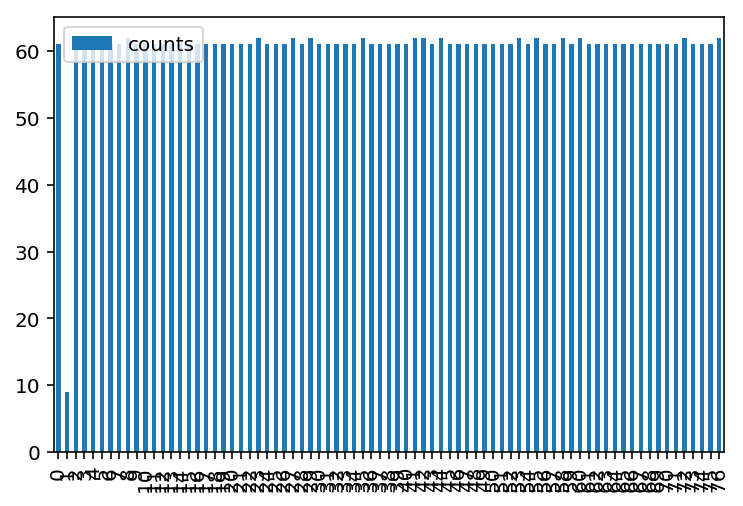

In [55]:
X_train.groupby(y_train).size().reset_index(name="counts").plot.bar()


In [56]:
from keras.preprocessing.image import load_img,img_to_array
from tqdm import tqdm

from skimage import io

X_train=[img_to_array(io.imread(file).astype("float")/255.0) for file in tqdm(X_train.values)]

100%|██████████| 4659/4659 [00:10<00:00, 452.11it/s]


In [57]:
X_test=[img_to_array(io.imread(file).astype("float")/255.0) for file in tqdm(X_test.values)]

100%|██████████| 823/823 [00:01<00:00, 453.11it/s]


In [58]:
X_train=np.array(X_train)
X_test=np.array(X_test)

In [59]:
X_train.shape,X_test.shape

((4659, 128, 128, 3), (823, 128, 128, 3))

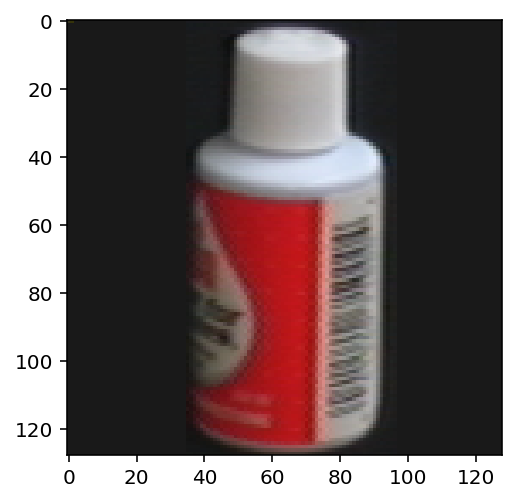

In [60]:
#X_test = X_test.reshape(-1, 128, 128,1)
import matplotlib.pyplot as plt

img = X_test[0]
plt.imshow(img)
plt.show()

In [61]:
len(X_test)

823

In [62]:
X_test.shape

(823, 128, 128, 3)

In [63]:
X_test_copy = X_test
X_train_copy = X_train

# Auto encoder 

In [64]:
from keras.layers import Dense, Flatten, Reshape, Input, InputLayer
from keras.models import Sequential, Model

def build_autoencoder(img_shape, code_size):
    # The encoder
    encoder = Sequential()
    encoder.add(InputLayer(img_shape))
    encoder.add(Flatten())
    encoder.add(Dense(code_size))

    # The decoder
    decoder = Sequential()
    decoder.add(InputLayer((code_size,)))
    decoder.add(Dense(np.prod(img_shape))) # np.prod(img_shape) is the same as 32*32*3, it's more generic than saying 3072
    decoder.add(Reshape(img_shape))

    return encoder, decoder


In [65]:
def show_image(x):
    plt.imshow(np.clip(x + 0.5, 0, 1))

In [66]:

# Same as (32,32,3), we neglect the number of instances from shape
IMG_SHAPE = X_test.shape[1:]
encoder, decoder = build_autoencoder(IMG_SHAPE, 1024)

inp = Input(IMG_SHAPE)
code = encoder(inp)
reconstruction = decoder(code)

autoencoder = Model(inp,reconstruction)
autoencoder.compile(optimizer='adamax', loss='mse')

print(autoencoder.summary())

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_6 (InputLayer)         (None, 128, 128, 3)       0         
_________________________________________________________________
sequential_3 (Sequential)    (None, 1024)              50332672  
_________________________________________________________________
sequential_4 (Sequential)    (None, 128, 128, 3)       50380800  
Total params: 100,713,472
Trainable params: 100,713,472
Non-trainable params: 0
_________________________________________________________________
None


In [67]:
history = autoencoder.fit(x=X_train, y=X_train, epochs=10,
                validation_data=[X_test, X_test])

Train on 4659 samples, validate on 823 samples
Epoch 1/10
4659/4659 [==============================] - 213s 46ms/step - loss: 1.7017 - val_loss: 0.0356
Epoch 2/10
4659/4659 [==============================] - 194s 42ms/step - loss: 0.0316 - val_loss: 0.0289
Epoch 3/10
4659/4659 [==============================] - 224s 48ms/step - loss: 0.0272 - val_loss: 0.0260
Epoch 4/10
4659/4659 [==============================] - 193s 41ms/step - loss: 0.0250 - val_loss: 0.0242
Epoch 5/10
4659/4659 [==============================] - 154s 33ms/step - loss: 0.0235 - val_loss: 0.0229
Epoch 6/10
4659/4659 [==============================] - 165s 35ms/step - loss: 0.0223 - val_loss: 0.0218
Epoch 7/10
4659/4659 [==============================] - 183s 39ms/step - loss: 0.0213 - val_loss: 0.0208
Epoch 8/10
4659/4659 [==============================] - 163s 35ms/step - loss: 0.0203 - val_loss: 0.0198
Epoch 9/10
4659/4659 [==============================] - 165s 35ms/step - loss: 0.0193 - val_loss: 0.0189
Epoch 10

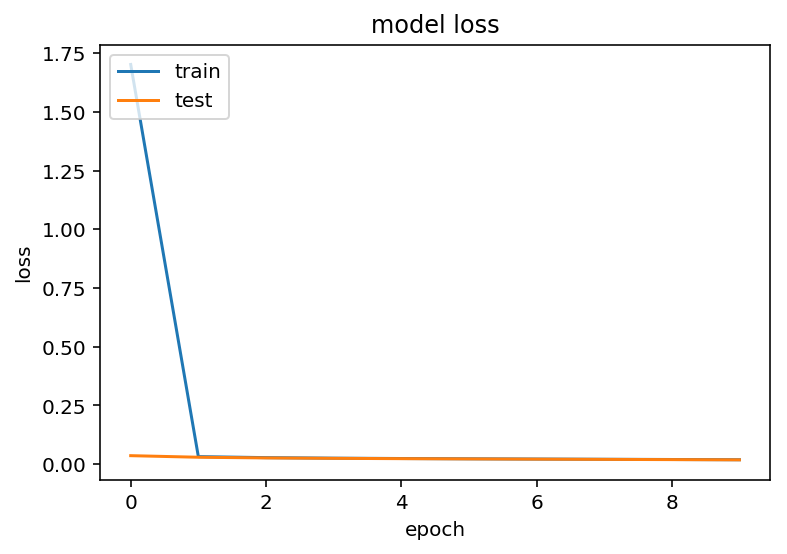

In [68]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

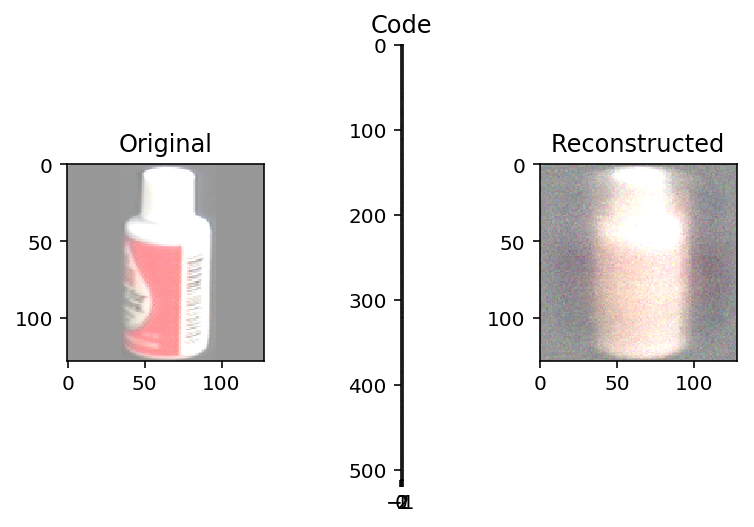

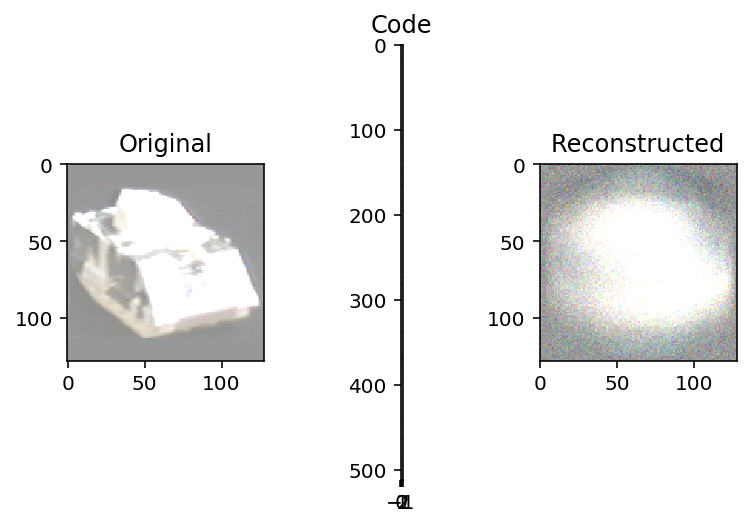

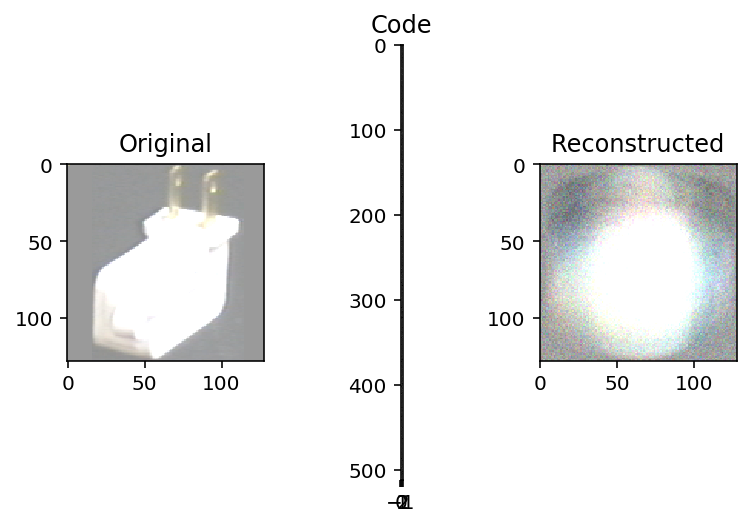

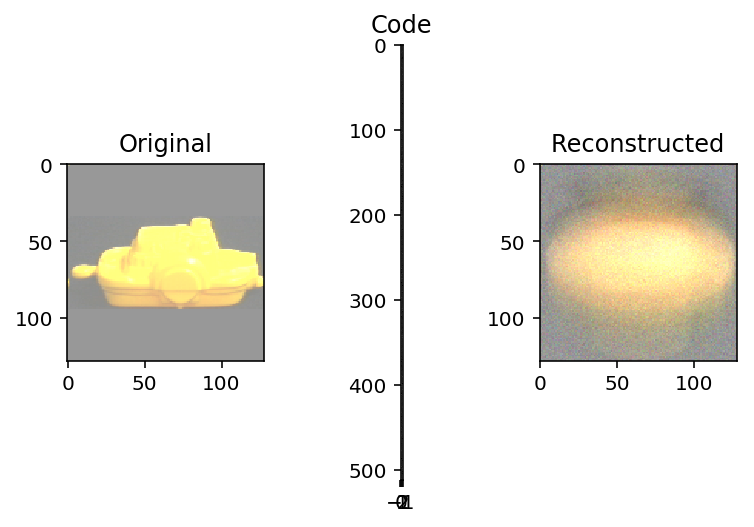

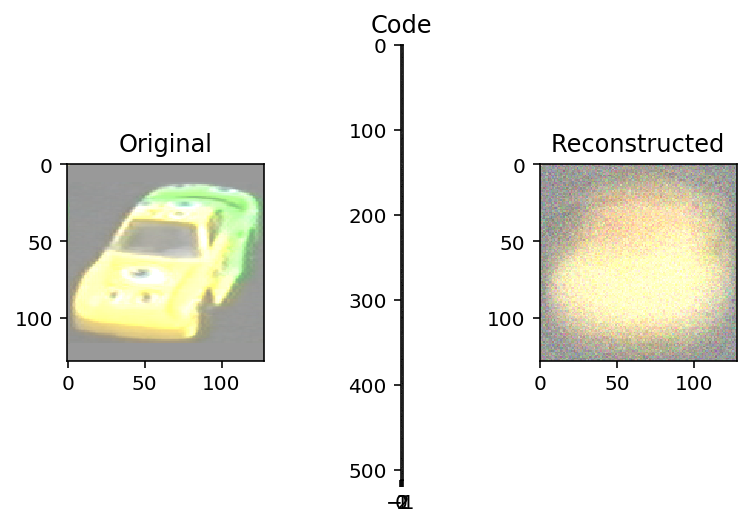

In [69]:
def visualize(img,encoder,decoder):
    """Draws original, encoded and decoded images"""
    # img[None] will have shape of (1, 32, 32, 3) which is the same as the model input
    code = encoder.predict(img[None])[0]
    reco = decoder.predict(code[None])[0]

    plt.subplot(1,3,1)
    plt.title("Original")
    show_image(img)

    plt.subplot(1,3,2)
    plt.title("Code")
    plt.imshow(code.reshape([code.shape[-1]//2,-1]))

    plt.subplot(1,3,3)
    plt.title("Reconstructed")
    show_image(reco)
    plt.show()

for i in range(5):
    img = X_test[i]
    visualize(img,encoder,decoder)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

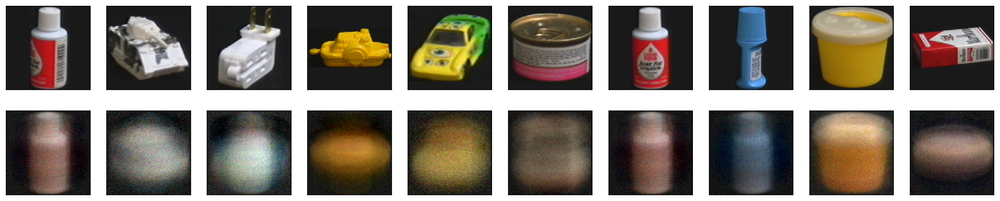

In [70]:
reconst_test = autoencoder.predict(X_test)
encode_test = encoder.predict(X_test)

n = 10
row = 2

plt.figure(figsize=(20, 4))
for i in range(n):
    # display original
    ax = plt.subplot(row, n, i + 1)
    plt.imshow(X_test[i].reshape(128, 128,3))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # display reconstruction
    ax = plt.subplot(row, n, i + 1 + n)
    plt.imshow(reconst_test[i].reshape(128, 128,3))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    
plt.show()

# LLE

In [71]:
X = encode_test
Y= 'gray'
n_neighbors = 30
print("Computing LLE embedding")
a = LocallyLinearEmbedding(n_components=2, n_neighbors=30)
data_2= a.fit_transform(X)
print("Done. Reconstruction error: %g" % a.reconstruction_error_)

Computing LLE embedding
Done. Reconstruction error: 1.09269e-06


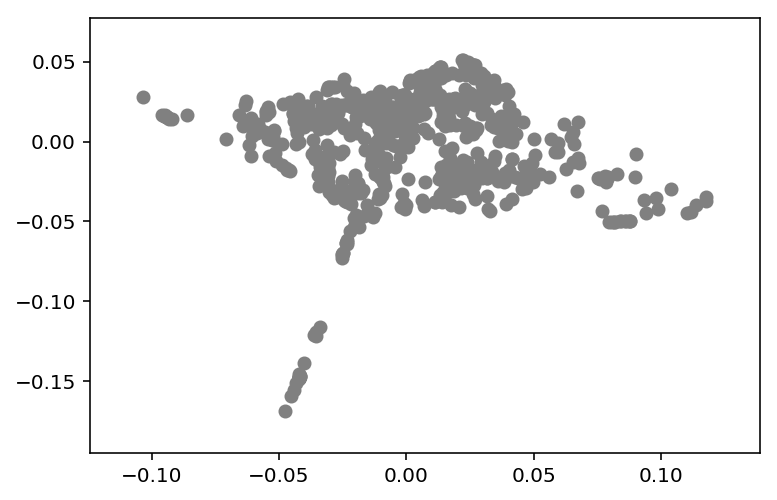

In [72]:
plt.scatter(data_2[:, 0], data_2[:, 1], c = Y)
plt.savefig("LLE.png")
plt.show()

In [73]:
from matplotlib import offsetbox

def plot_components(data, proj, images=None, ax=None,
                    thumb_frac=0.05, cmap='gray'):
    ax = ax or plt.gca()    
    
    ax.plot(proj[:, 0], proj[:, 1], '.k')
    
    if images is not None:
        min_dist_2 = (thumb_frac * max(proj.max(0) - proj.min(0))) ** 2
        shown_images = np.array([2 * proj.max(0)])
        for i in range(data.shape[0]):
            dist = np.sum((proj[i] - shown_images) ** 2, 1)
            if np.min(dist) < min_dist_2:
                # don't show points that are too close
                continue
            shown_images = np.vstack([shown_images, proj[i]])
            imagebox = offsetbox.AnnotationBbox(
                offsetbox.OffsetImage(images[i], cmap=cmap),
                                      proj[i])
            ax.add_artist(imagebox)

In [74]:
fig, ax = plt.subplots(figsize=(90, 90))

plot_components(encode_test,data_2, images=X_test.reshape(823, 128, 128, 3),
                ax=ax, thumb_frac=0.02, cmap='gray_r')

# Loss Functions

In [75]:
def autoencoder_loss(X, reconstructed_X):
    return np.square(np.subtract(X, reconstructed_X)).mean()

In [76]:
def mse_objective(autoencoder_loss, lle_loss, lamda = 0.02):
    return autoencoder_loss + lamda*lle_loss

In [77]:
ae_loss = autoencoder_loss(X_test,reconst_test)
ae_loss

0.017865794

In [78]:
lle_loss=a.reconstruction_error_
lle_loss

1.0926910889983516e-06

In [79]:
global_mse = mse_objective(ae_loss, lle_loss)
global_mse

0.017865815633314158

# Combination AE & LLE

In [80]:
mse = []
ae_mse = []
lle_mse = []
mse.append(global_mse)
ae_mse.append(ae_loss)
lle_mse.append(lle_loss)


In [90]:
iterations = 0
cmp = 30
improv =  1
while (improv > 0.0001) and (global_mse > 0.001) and (iterations < cmp):
    #reload the data
    X_train = X_train_copy
    X_test = X_test_copy
    
    #Update AE params
    history = autoencoder.fit(x=X_train, y=X_train, epochs=20,
                validation_data=[X_test, X_test])
    reconst_test = autoencoder.predict(X_test)
    encode_test = encoder.predict(X_test)
    #Update LLE weights
    #a = LocallyLinearEmbedding(n_components=2, n_neighbors=30)
    data_2= a.fit_transform( encode_test)
    
    #Calculate global mse
    lle_loss=a.reconstruction_error_
    ae_loss = autoencoder_loss(X_test,reconst_test)
    global_mse = mse_objective(ae_loss, lle_loss)
    lle_mse.append(lle_loss)
    ae_mse.append(ae_loss)
    mse.append(global_mse)
    improv =  mse[iterations] - global_mse
    iterations =iterations +1
    print ('AE loss : ', ae_loss)
    print ('LLE loss : ', lle_loss)
    print ('Global loss : ', global_mse)

Train on 4659 samples, validate on 823 samples
Epoch 1/20
4659/4659 [==============================] - 179s 38ms/step - loss: 0.0066 - val_loss: 0.0064
Epoch 2/20
4659/4659 [==============================] - 163s 35ms/step - loss: 0.0061 - val_loss: 0.0063
Epoch 3/20
4659/4659 [==============================] - 147s 32ms/step - loss: 0.0066 - val_loss: 0.0060
Epoch 4/20
4659/4659 [==============================] - 145s 31ms/step - loss: 0.0060 - val_loss: 0.0060
Epoch 5/20
4659/4659 [==============================] - 146s 31ms/step - loss: 0.0063 - val_loss: 0.0063
Epoch 6/20
4659/4659 [==============================] - 146s 31ms/step - loss: 0.0079 - val_loss: 0.0079
Epoch 7/20
4659/4659 [==============================] - 144s 31ms/step - loss: 0.0205 - val_loss: 0.2541
Epoch 8/20
4659/4659 [==============================] - 145s 31ms/step - loss: 0.0261 - val_loss: 0.0048
Epoch 9/20
4659/4659 [==============================] - 146s 31ms/step - loss: 0.0043 - val_loss: 0.0045
Epoch 10

# Evaluation

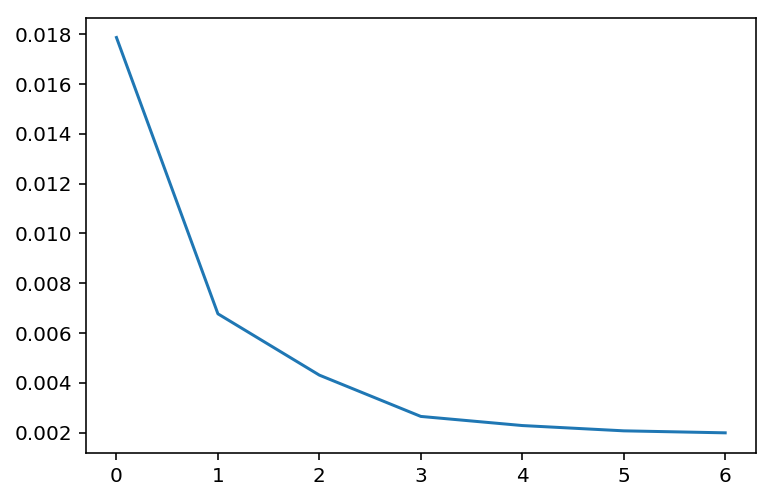

In [95]:
#plt.plot(mse)
#plt.plot(lle_mse)
plt.plot(ae_mse)

In [96]:
#Clustering & Visualisation
fig, ax = plt.subplots(figsize=(90, 90))

plot_components(encode_test,data_2, images=X_test.reshape(823, 128, 128, 3),
                ax=ax, thumb_frac=0.02, cmap='gray_r')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

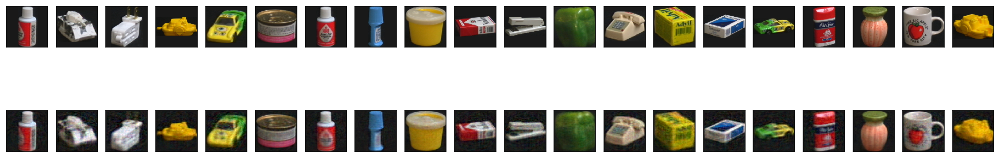

In [98]:
n = 20
row = 2

plt.figure(figsize=(20, 4))
for i in range(n):
    # display original
    ax = plt.subplot(row, n, i + 1)
    plt.imshow(X_test[i].reshape(128, 128,3))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # display reconstruction
    ax = plt.subplot(row, n, i + 1 + n)
    plt.imshow(reconst_test[i].reshape(128, 128,3))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    
plt.show()

# Outputs

In [110]:
#S weights matrix
S=a.nbrs_.kneighbors_graph()
S.toarray()

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [111]:
# Encoding matrix
f = encode_test

In [112]:
# Embedding matrix
B = data_2